In [3]:
import utils
import enumeration
import utils_func
import argparse
import torch
import gc

from torchvision.transforms import transforms


gc.collect()
torch.cuda.empty_cache()


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
# parse arguments
parser = argparse.ArgumentParser(description="Process some parameters.")
parser.add_argument("--wandb_logging", type=bool, default=False, help="log to wandb")
parser.add_argument("--batch_size", type=int, default=64, help="batch size")
parser.add_argument(
    "--dataset",
    type=str,
    default="cifar10",
    choices=["cifar10", "cifar100"],
    help="dataset",
)
parser.add_argument("--epsilon", type=float, default=8 / 255, help="epsilon")
parser.add_argument("--alpha", type=float, default=2 / 255, help="alpha")
parser.add_argument(
    "--sampling_iterations", type=int, default=20, help="sampling iterations"
)
parser.add_argument(
    "--architecture_name", type=str, default="WideResNet", help="architecture name"
)
parser.add_argument(
    "--from_robustbench", type=bool, default=True, help="load model from robustbench"
)
parser.add_argument(
    "--init",
    type=str,
    default="random",
    choices=["random", "pca", "gaussian", "informative", "informative+pca"],
    help="initialization for the generation",
)

parser.add_argument("--seed", type=int, default=0, help="random seed")
parser.add_argument("--data_dir", type=str, default="./data", help="data directory")
parser.add_argument(
    "--model_name",
    type=str,
    default="Zhang2019Theoretically",
    help="define the name of the model to be loaded",
)
parser.add_argument(
    "--model_source",
    type=str,
    default="robustbench",
    choices=["robustbench", "jem", "local"],
    help="the source from where the model is loaded",
)
parser.add_argument(
    "--model_dir",
    type=str,
    default="./models",
)
parser.add_argument(
    "--threat model",
    type=str,
    default="Linf",
    choices=["Linf", "L2"],
    help="threat model",
)

_StoreAction(option_strings=['--threat model'], dest='threat model', nargs=None, const=None, default='Linf', type=<class 'str'>, choices=['Linf', 'L2'], required=False, help='threat model', metavar=None)

In [5]:

try:
    args = parser.parse_args()
    wandb = args.wandb_logging
    batch_size = args.batch_size
    dataset = args.dataset
    epsilon = args.epsilon
    alpha = args.alpha
    sampling_iterations = args.sampling_iterations
    architecture_name = args.architecture_name
    from_robustbench = args.from_robustbench
    initialization = args.init
    data_dir = args.data_dir
    seed = args.seed
    model_name = args.model_name
    model_source = args.model_source
    model_dir = args.model_dir
    threat_model = args.threat_model

    print("Using arguments from parser")

except:
    print("Using default arguments")
    wandb = False
    batch_size = 64
    dataset = "cifar10"
    epsilon = 8 / 255
    alpha = 2 / 255
    sampling_iterations = 20
    architecture_name = "WideResNet"
    from_robustbench = True
    init = "random"
    data_dir = "./data"
    seed = 0
    model_name = "Zhang2019Theoretically"
    source = 'robustbench'
    model_dir = "./models"
    threat_model = "Linf"

Using default arguments


In [6]:
# set seed for the reproducibility of the results
import random

import numpy as np

torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

In [7]:
# logging on wandb
if wandb:
    import wandb

    config = {
        "dataset": dataset,
        "batch_size": batch_size,
        "epsilon": epsilon,
        "alpha": alpha,
        "sampling_iterations": sampling_iterations,
        "architecture name": architecture_name,
        "from_robustbench": from_robustbench,
        "initialization": init,
        'model name': model_name,
        'model source': model_source
    }
    wandb.init(name="generation", project="LE-PGD",
               entity="le-pgd", config=config)

In [8]:

transform = transforms.Compose(
    [
        transforms.ToTensor(),
    ]
)

dataset_train, dataset_test = utils.load_clean_dataset(
    dataset=enumeration.BenchmarkDataset(dataset.lower()),
    n_examples=None,
    data_dir=data_dir,
    transform=transform,
)
train_dataloader = torch.utils.data.DataLoader(
    dataset_train, batch_size=batch_size, shuffle=True
)
test_dataloader = torch.utils.data.DataLoader(
    dataset_test, batch_size=batch_size, shuffle=False
)

Files already downloaded and verified
Files already downloaded and verified


## Define and load the model

The default option is to load the model whose name is specified in the arguments 

In [9]:
from robustbench.utils import load_model
from torch import nn

from JEMPP.models.jem_models import F, CCF
from JEMPP.models.wideresnet import Wide_ResNet as WideResNet


architecture_dict = {'wideresnet': WideResNet}

assert architecture_name.lower() in architecture_dict.keys()

In [10]:
if model_source == "robustbench":
    model = load_model(
        model_name="Zhang2019Theoretically",
        dataset="cifar10",
        threat_model="Linf",
        model_dir="./models",
    )
    model = nn.DataParallel(model, device_ids=[0])
    model.to(device)
elif model_source == "jem":
    model_cls = F
    model = model_cls(
        enumeration.dataset_image_size[dataset],
        enumeration.dataset_num_classes[dataset],
        norm="batch",
        n_classes=enumeration.dataset_num_classes[dataset],
        model="wrn",
    )
    ckpt_dict = torch.load("./models/cifar10/Linf/sadajem5_95.5_9.4.pt")
    model.load_state_dict(ckpt_dict["model_state_dict"])
    model = nn.DataParallel(model, device_ids=[0, 1])
    model.to(device)
    replay_buffer = ckpt_dict["replay_buffer"]

elif model_source == "local":
    model_path = model_dir + "/wandb_model/" + model_name + ".pt"
    # check missimg 2 factors in architecture instanciation
    model = (
        architecture_dict[architecture_name]()
        .to(device)
        .load_state_dict(torch.load(model_path))
        .eval()
    )


print(
    f"The model is taken form : {model_source} \nthe name of the model is : {model_name}\nthe architecture of the model is : {architecture_name}"
)

The model is taken form : robustbench 
the name of the model is : Zhang2019Theoretically
the architecture of the model is : WideResNet


In the cell below there is the computation of the mean of the dataset for each category and then the estimate of the dataset as a GMM where each class is a gaussian distribution

In [ ]:
utils_func.category_mean(
    dload_train=train_dataloader,
    n_classes=enumeration.dataset_num_classes[dataset],
    name_dataset=dataset,
    image_size=enumeration.dataset_image_size[dataset],
    n_channels=3,
    data_dir=data_dir,
)
buffer = utils.center_initialization(
    dataset=dataset, n_classes=enumeration.dataset_num_classes[dataset]
)

replay_buffer = []

## Evaluation of the performance of the model for each initialization

The evaluation focuses on establishing the best way of initializing the generation.
The fixed parameters are :
- generated samples : 12 per class
- labels to generate : a subset of 10 labels 
- seed: defined as argument 
- the norm considered in the perturbation: Linf 
- Loss for the perturbation : energy_xy
- Dataset
- optimizer: SGLD

In [ ]:
num_samples = 5
label_to_plot = [i for i in range (10)]
loss = 'energy_xy'
step_size = 0.08

In [ ]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=step_size,
    n_steps=5,
    inizialization='random',
    n_steps_sampling=1,
    loss=loss,
    replay_buffer=replay_buffer,
    buffer=buffer,
)

  0%|          | 0/10 [00:00<?, ?it/s]/home/mary/miniconda3/envs/robustbench/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1695392020201/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
100%|██████████| 10/10 [00:06<00:00,  1.66it/s]


### The start is ```informative```

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=0.2,
    n_steps=100,
    inizialization="informative",
    n_steps_sampling=1,
    loss="energy_xy",
    replay_buffer=replay_buffer,
    buffer=buffer,
)

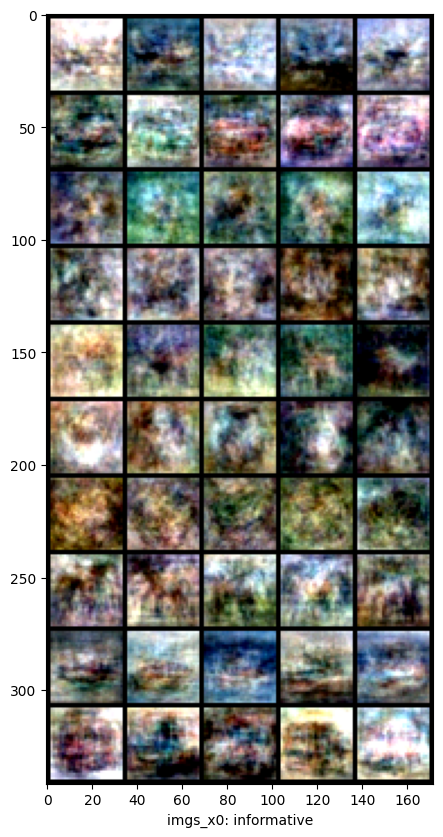

In [ ]:
utils_func.plot_imgs_generated(
    x0,
    inizialization="informative",
    rows=10,
    size=(12, 10),
    path="./data/imgs_x0.pdf",
    name="imgs_x0: ",
)

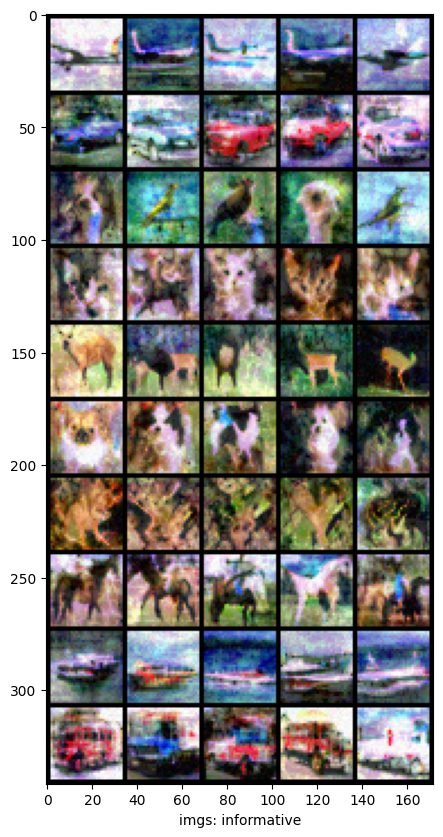

In [ ]:
utils_func.plot_imgs_generated(
    imgs,
    inizialization="informative",
    rows=10,
    size=(12, 10),
    path="./data/imgs.pdf",
    name="imgs: ",
)

### The start is ```pca```

The first attempt is with retained variance equal to 0.80

The retained variance s 0.8 and the kernel for gaussian blur has dim 1


Using number of componets 3 with  retained_variance 0.8
Using number of componets 5 with  retained_variance 0.8
Using number of componets 4 with  retained_variance 0.8
Using number of componets 4 with  retained_variance 0.8
Using number of componets 4 with  retained_variance 0.8
Using number of componets 5 with  retained_variance 0.8
Using number of componets 4 with  retained_variance 0.8
Using number of componets 5 with  retained_variance 0.8
Using number of componets 4 with  retained_variance 0.8
Using number of componets 6 with  retained_variance 0.8


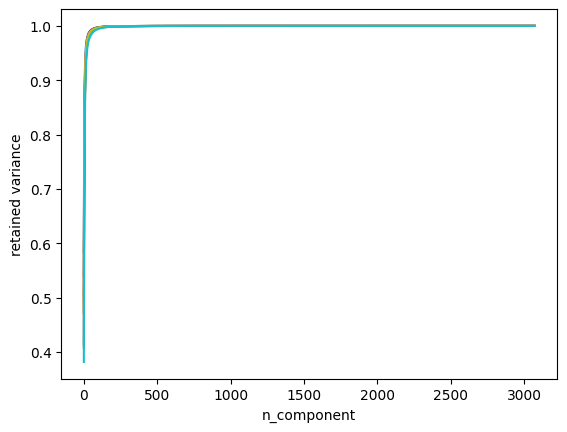

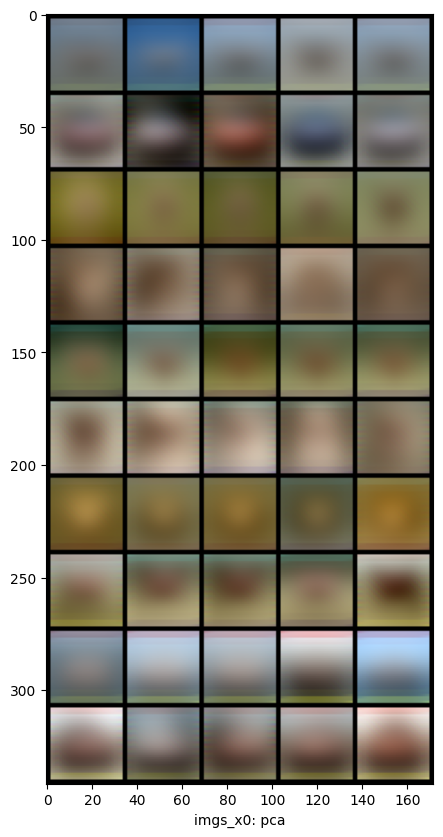

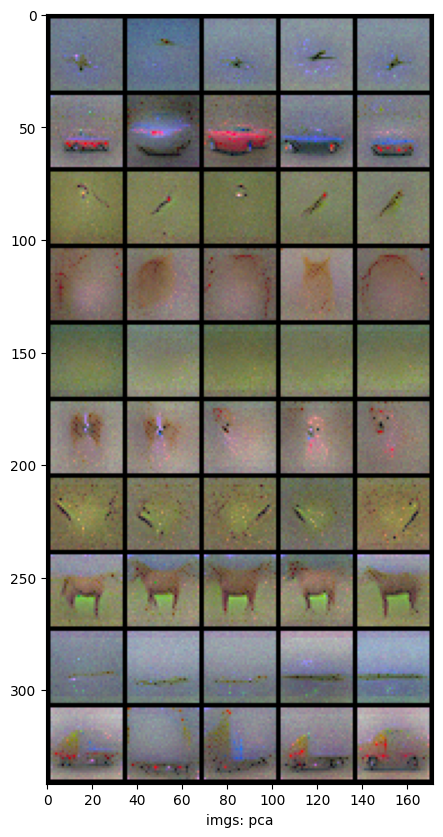

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=0.8,
    n_steps=10,
    inizialization='pca',
    n_steps_sampling=1,
    loss=loss,
    replay_buffer=replay_buffer,
    buffer=buffer,
    gaussian_blur = 1
)
utils_func.plot_imgs_generated(
    x0,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_x0_pca.pdf",
    name="imgs_x0: ",
)
utils_func.plot_imgs_generated(
    imgs,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_pca.pdf",
    name="imgs: ",
)

The retained variance s 0.8 and the kernel for gaussian blur has dim 3 


Using number of componets 3 with  retained_variance 0.8
Using number of componets 5 with  retained_variance 0.8
Using number of componets 4 with  retained_variance 0.8
Using number of componets 4 with  retained_variance 0.8
Using number of componets 4 with  retained_variance 0.8
Using number of componets 5 with  retained_variance 0.8
Using number of componets 4 with  retained_variance 0.8
Using number of componets 5 with  retained_variance 0.8
Using number of componets 4 with  retained_variance 0.8
Using number of componets 6 with  retained_variance 0.8


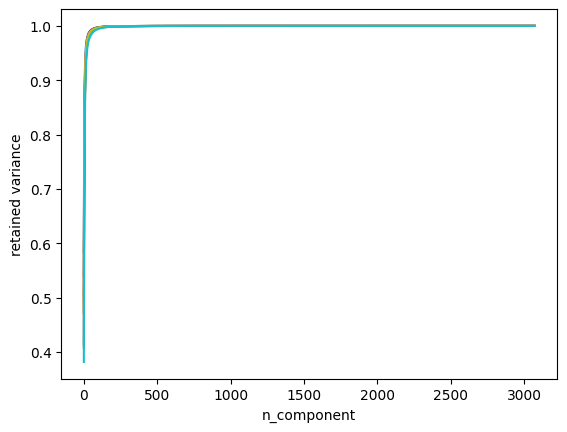

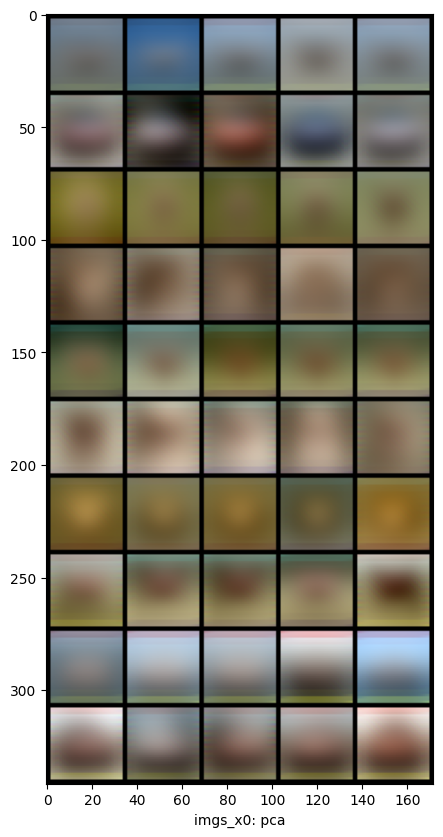

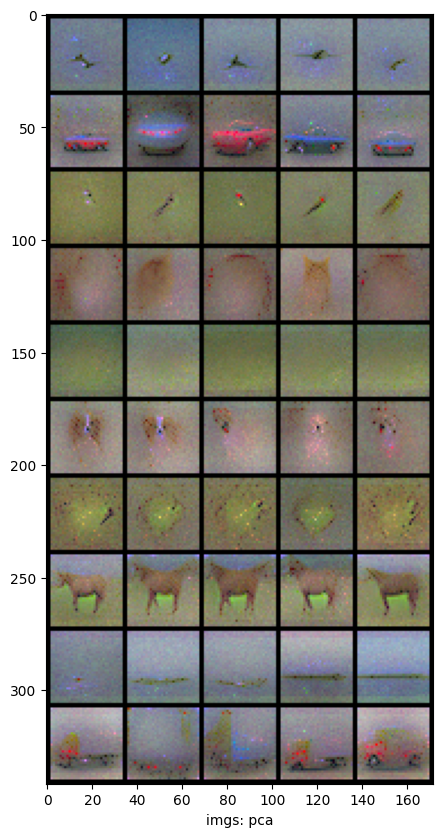

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=0.8,
    n_steps=10,
    inizialization='pca',
    n_steps_sampling=1,
    loss=loss,
    replay_buffer=replay_buffer,
    buffer=buffer,
    gaussian_blur = 1
)
utils_func.plot_imgs_generated(
    x0,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_x0_pca.pdf",
    name="imgs_x0: ",
)
utils_func.plot_imgs_generated(
    imgs,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_pca.pdf",
    name="imgs: ",
)

The retained variance is 0.90

Using number of componets 73 with  retained_variance 0.9
Using number of componets 116 with  retained_variance 0.9
Using number of componets 82 with  retained_variance 0.9
Using number of componets 79 with  retained_variance 0.9
Using number of componets 98 with  retained_variance 0.9
Using number of componets 90 with  retained_variance 0.9
Using number of componets 125 with  retained_variance 0.9
Using number of componets 109 with  retained_variance 0.9
Using number of componets 74 with  retained_variance 0.9
Using number of componets 130 with  retained_variance 0.9


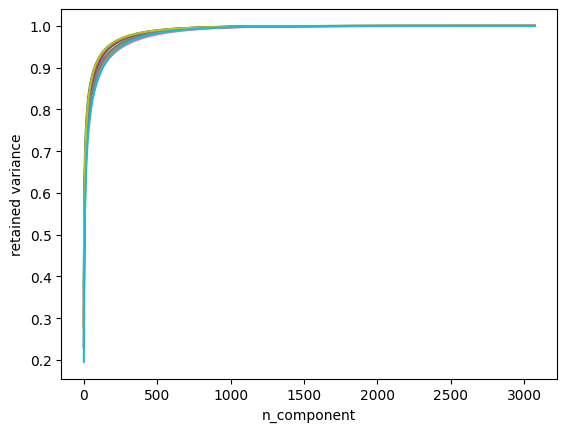

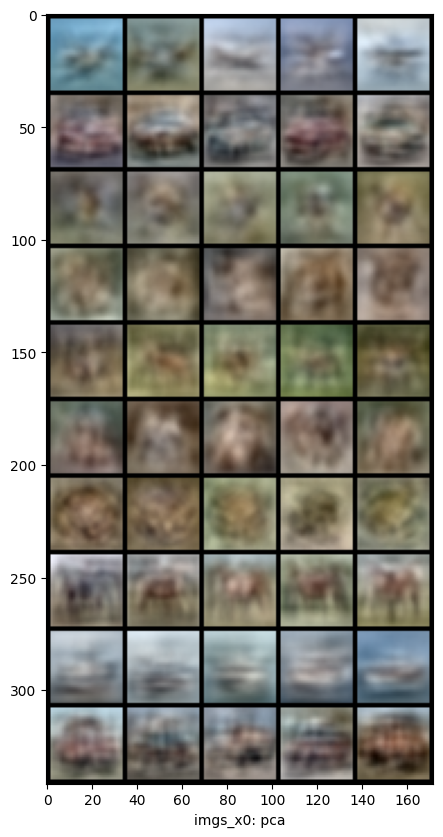

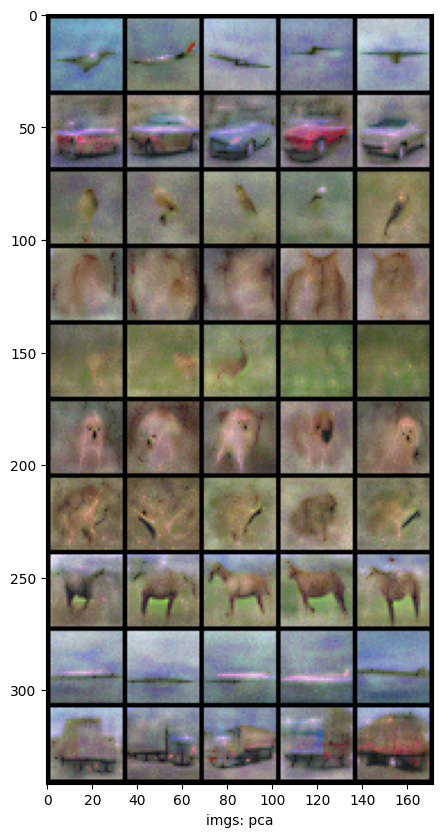

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=0.8,
    n_steps=10,
    inizialization='pca',
    n_steps_sampling=1,
    loss=loss,
    replay_buffer=replay_buffer,
    buffer=buffer,
    
    variance = 0.90
)
utils_func.plot_imgs_generated(
    x0,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_x0_pca.pdf",
    name="imgs_x0: ",
)
utils_func.plot_imgs_generated(
    imgs,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_pca.pdf",
    name="imgs: ",
)

The retained variance is 0.65

Using number of componets 6 with  retained_variance 0.65


/home/mary/miniconda3/envs/robustbench/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1695392020201/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,


Using number of componets 12 with  retained_variance 0.65
Using number of componets 7 with  retained_variance 0.65
Using number of componets 8 with  retained_variance 0.65
Using number of componets 9 with  retained_variance 0.65
Using number of componets 11 with  retained_variance 0.65
Using number of componets 9 with  retained_variance 0.65
Using number of componets 13 with  retained_variance 0.65
Using number of componets 8 with  retained_variance 0.65
Using number of componets 16 with  retained_variance 0.65


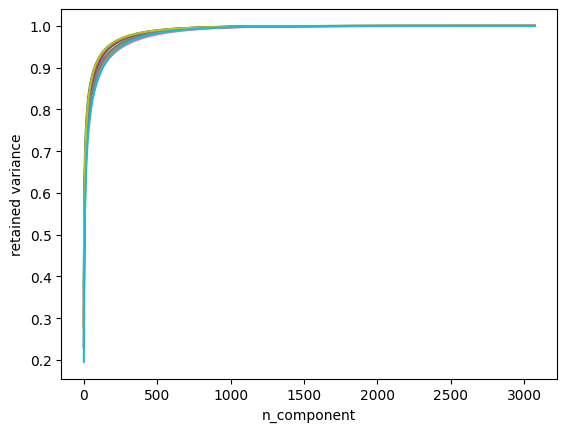

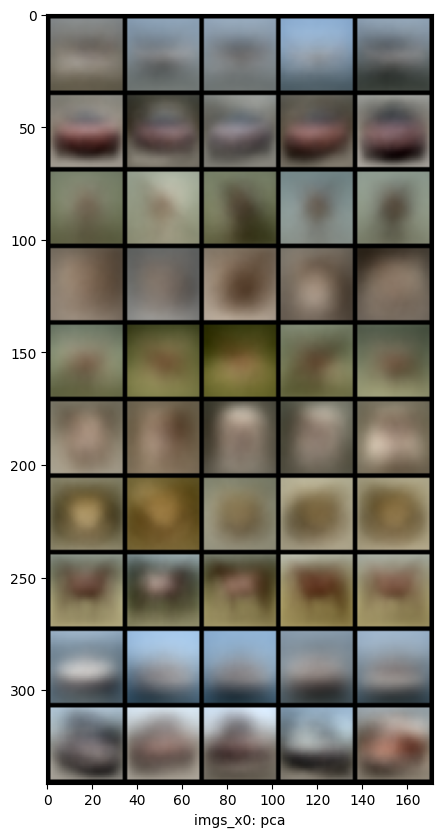

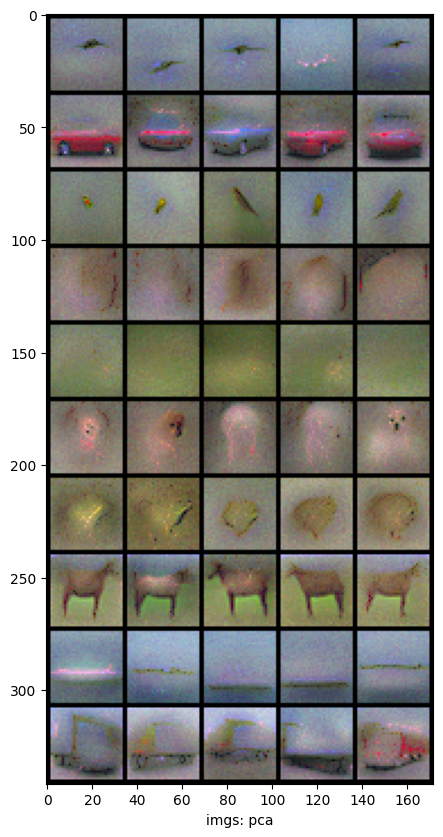

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=0.8,
    n_steps=10,
    inizialization='pca',
    n_steps_sampling=1,
    loss=loss,
    replay_buffer=replay_buffer,
    buffer=buffer,
    
    variance = 0.65
)
utils_func.plot_imgs_generated(
    x0,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_x0_pca.pdf",
    name="imgs_x0: ",
)
utils_func.plot_imgs_generated(
    imgs,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_pca.pdf",
    name="imgs: ",
)

The retained variance is 0.95

Using number of componets 163 with  retained_variance 0.95
Using number of componets 235 with  retained_variance 0.95
Using number of componets 185 with  retained_variance 0.95
Using number of componets 171 with  retained_variance 0.95
Using number of componets 215 with  retained_variance 0.95
Using number of componets 184 with  retained_variance 0.95
Using number of componets 266 with  retained_variance 0.95
Using number of componets 221 with  retained_variance 0.95
Using number of componets 164 with  retained_variance 0.95
Using number of componets 254 with  retained_variance 0.95


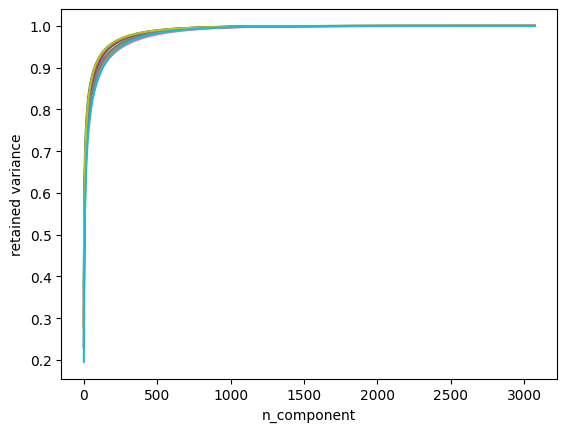

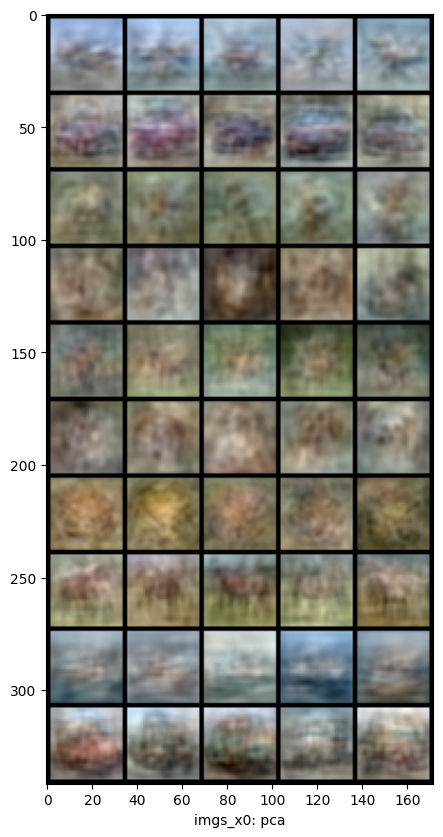

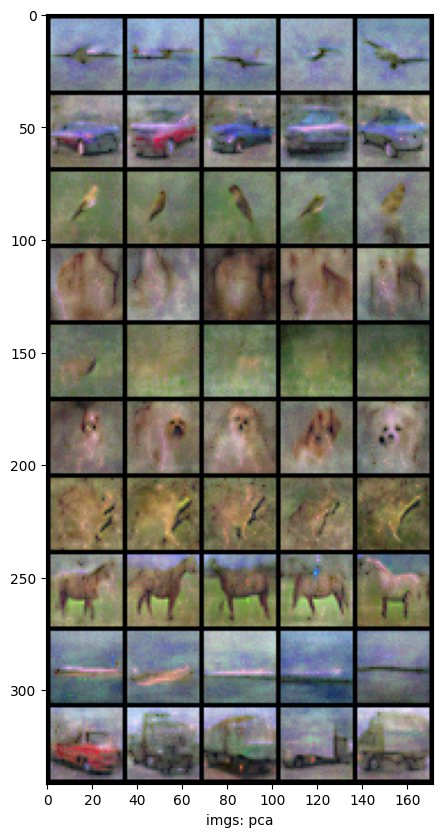

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=0.8,
    n_steps=10,
    inizialization='pca',
    n_steps_sampling=1,
    loss=loss,
    replay_buffer=replay_buffer,
    buffer=buffer,
    
    variance = 0.95
)
utils_func.plot_imgs_generated(
    x0,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_x0_pca.pdf",
    name="imgs_x0: ",
)
utils_func.plot_imgs_generated(
    imgs,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_pca.pdf",
    name="imgs: ",
)

The retained variance is 0.99

Using number of componets 514 with  retained_variance 0.99
Using number of componets 644 with  retained_variance 0.99
Using number of componets 574 with  retained_variance 0.99
Using number of componets 525 with  retained_variance 0.99
Using number of componets 630 with  retained_variance 0.99
Using number of componets 538 with  retained_variance 0.99
Using number of componets 709 with  retained_variance 0.99
Using number of componets 604 with  retained_variance 0.99
Using number of componets 510 with  retained_variance 0.99
Using number of componets 659 with  retained_variance 0.99


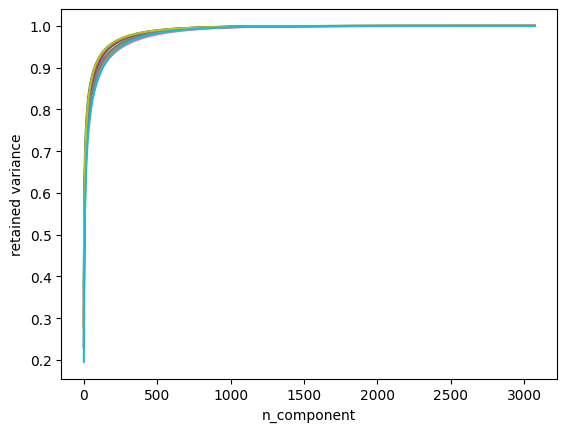

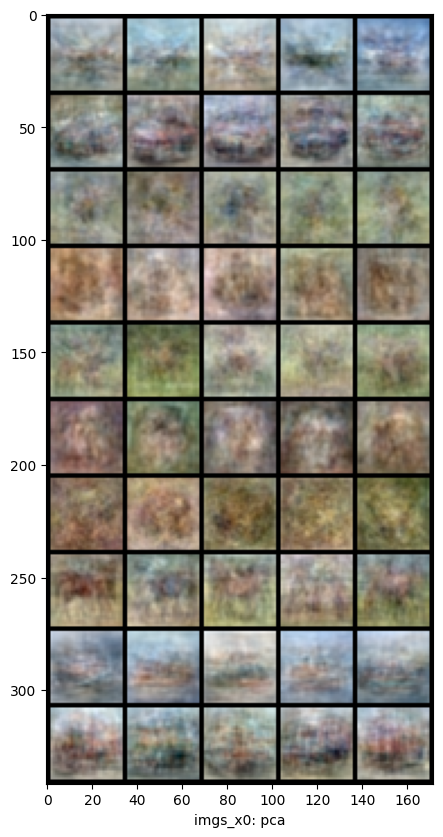

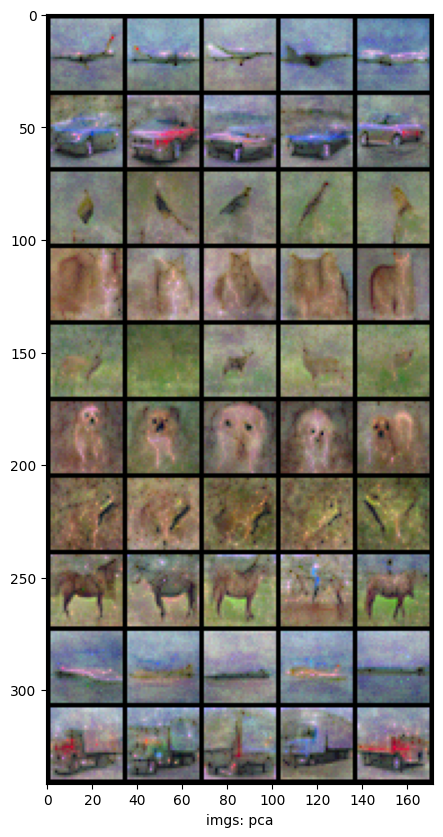

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=0.8,
    n_steps=10,
    inizialization='pca',
    n_steps_sampling=1,
    loss=loss,
    replay_buffer=replay_buffer,
    buffer=buffer,
    
    variance = 0.99
)
utils_func.plot_imgs_generated(
    x0,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_x0_pca.pdf",
    name="imgs_x0: ",
)
utils_func.plot_imgs_generated(
    imgs,
    inizialization="pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_pca.pdf",
    name="imgs: ",
)

Using number of componets 23 with  retained_variance 0.8
Using number of componets 41 with  retained_variance 0.8
Using number of componets 26 with  retained_variance 0.8
Using number of componets 27 with  retained_variance 0.8
Using number of componets 30 with  retained_variance 0.8
Using number of componets 33 with  retained_variance 0.8
Using number of componets 38 with  retained_variance 0.8
Using number of componets 40 with  retained_variance 0.8
Using number of componets 25 with  retained_variance 0.8
Using number of componets 49 with  retained_variance 0.8


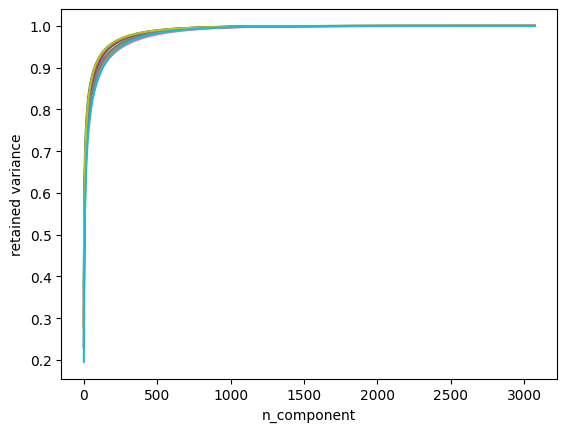

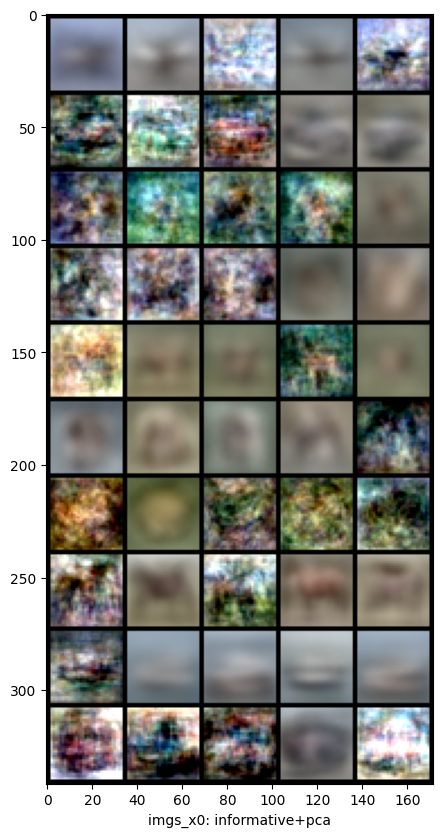

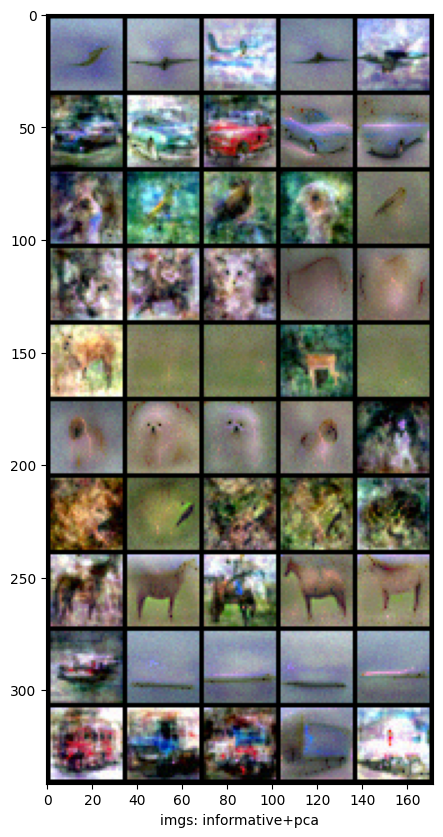

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=0.8,
    n_steps=10,
    inizialization='informative+pca',
    n_steps_sampling=1,
    loss=loss,
    replay_buffer=replay_buffer,
    buffer=buffer,
)
utils_func.plot_imgs_generated(
    x0,
    inizialization="informative+pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_x0_informative+pca.pdf",
    name="imgs_x0: ",
)
utils_func.plot_imgs_generated(
    imgs,
    inizialization="informative+pca",
    rows=10,
    size=(12, 10),
    path="./data/imgs_.pdf",
    name="imgs: ",
)


### The start is ```noise_injection```

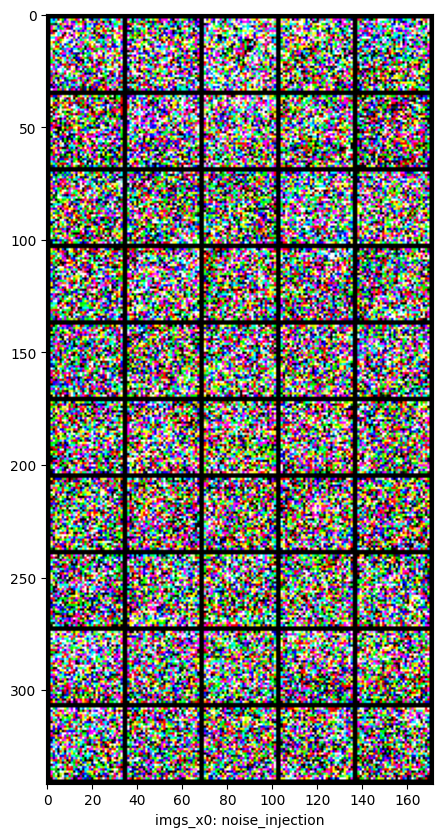

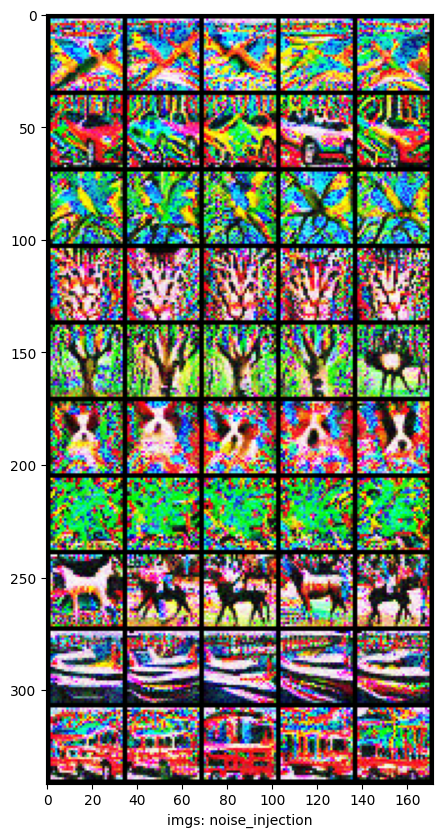

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=0.4,
    n_steps=1000,
    inizialization='noise_injection',
    n_steps_sampling=1,
    loss=loss,
    replay_buffer=replay_buffer,
    buffer=buffer,
    test = dataset_test
)
utils_func.plot_imgs_generated(
    x0,
    inizialization="noise_injection",
    rows=10,
    size=(12, 10),
    path="./data/imgs_x0_noise_injection.pdf",
    name="imgs_x0: ",
)
utils_func.plot_imgs_generated(
    imgs,
    inizialization="noise_injection",
    rows=10,
    size=(12, 10),
    path="./data/imgs_noise_injection.pdf",
    name="imgs: ",
    
    
    
)


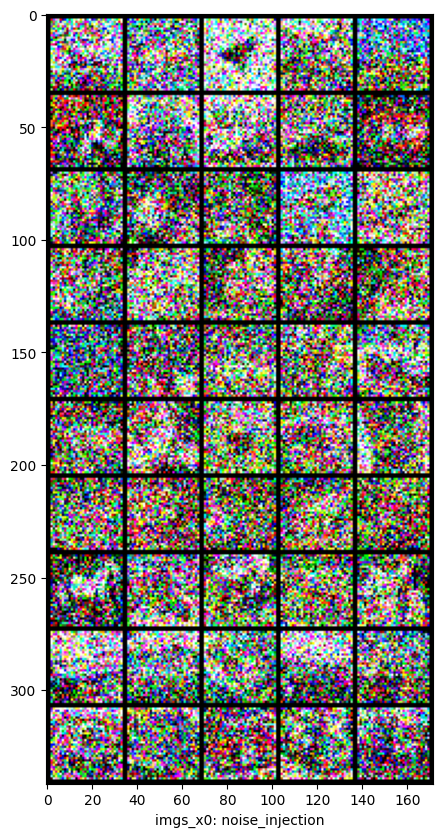

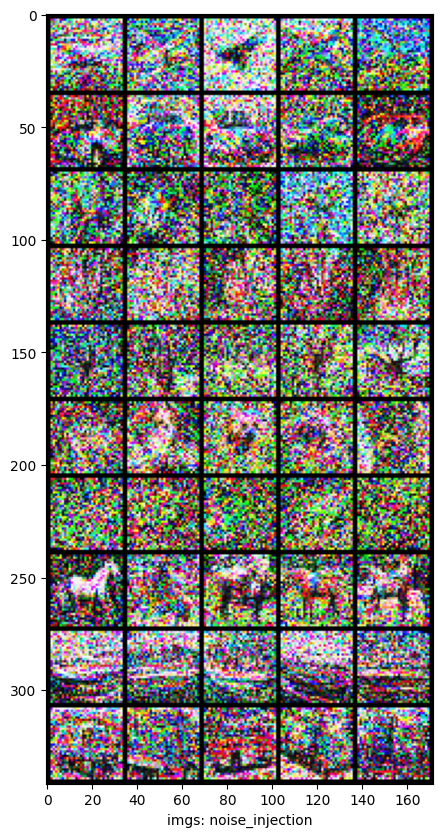

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=0.3,
    n_steps=100,
    inizialization='noise_injection',
    n_steps_sampling=1,
    loss=loss,
    replay_buffer=replay_buffer,
    buffer=buffer,
    test = dataset_test,
    alpha = 20
)
utils_func.plot_imgs_generated(
    x0,
    inizialization="noise_injection",
    rows=10,
    size=(12, 10),
    path="./data/imgs_x0_noise_injection.pdf",
    name="imgs_x0: ",
)
utils_func.plot_imgs_generated(
    imgs,
    inizialization="noise_injection",
    rows=10,
    size=(12, 10),
    path="./data/imgs_noise_injection.pdf",
    name="imgs: ",
    
    
    
)


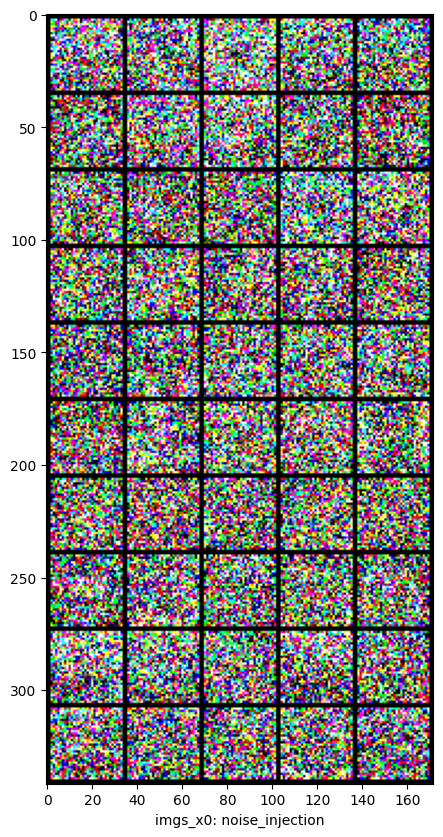

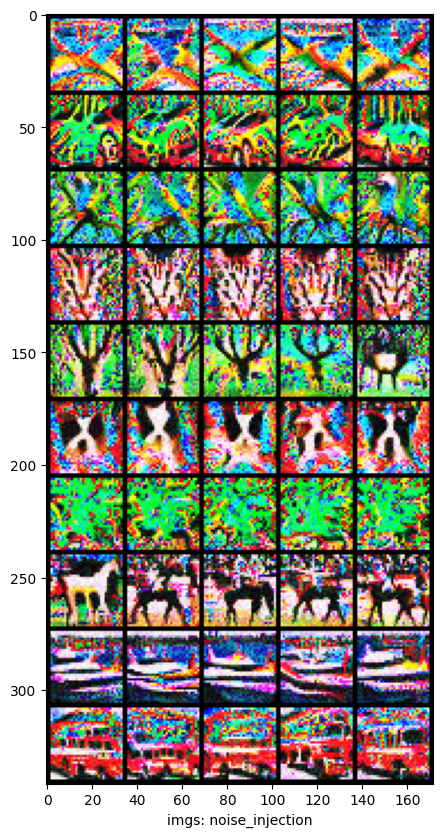

In [ ]:
x0, imgs = utils.new_samples(
    model=model,
    label=label_to_plot,
    batch_size=num_samples,
    step_size=0.5,
    n_steps=1000,
    inizialization='noise_injection',
    n_steps_sampling=1,
    loss=loss,
    replay_buffer=replay_buffer,
    buffer=buffer,
    test = dataset_test
)
utils_func.plot_imgs_generated(
    x0,
    inizialization="noise_injection",
    rows=10,
    size=(12, 10),
    path="./data/imgs_x0_noise_injection.pdf",
    name="imgs_x0: ",
)
utils_func.plot_imgs_generated(
    imgs,
    inizialization="noise_injection",
    rows=10,
    size=(12, 10),
    path="./data/imgs_noise_injection.pdf",
    name="imgs: ",
    
    
    
)
